# <span style="color:red">Analisi dati della Sloan Digital Sky Survey DR17</span>

Il dataset (file star_classification.csv) si compone di 100.000 osservazioni di oggetti celesti, effettuate dall'SDSS (Sloan Digital Sky Survey) tramite un telescopio da 2,5 metri di diametro, situato presso l'osservatorio di Apache Point nel Nuovo Messico. Ogni osservazione è descritta da 17 caratteristiche, mentre 1 colonna "classe" identifica se l'oggetto è una stella, una galassia o un quasar.  
Le caratteristiche presentate sono (i numeri si riferiscono alla colonna del dataset iniziale nella quale compaiono, da 0 a 17):

A) identificative dell'oggetto

    0. obj_ID = Identificatore dell'oggetto. È un valore univoco che identifica l'oggetto nel "Catalog Archive Server" (CAS).  
    12. spec_obj_ID = Identificatore univoco usato nella spettroscopia ottica degli oggetti (due diverse osservazioni con lo stesso spec_obj_ID devono appartenere alla stessa classe)

B) posizionali e di redshift

    1. alpha (RA) [grad] = Ascensione retta (riferita all'epoca J2000: 1 gennaio 2000 alle 12:00 del Tempo Universale)
    2. delta (DEC) [grad] = Declinazione (riferita all'epoca J2000: 1 gennaio 2000 alle 12:00 del Tempo Universale)
    14. redshift (z_{red}) = Redshift dell'oggetto (peculiare + cosmologico)

C) fotometriche  

    3. u [mag] = Magnitudine apparente nell'ultravioletto
    4. g [mag] = Magnitudine apparente nel verde
    5. r [mag] = Magnitudine apparente nel rosso
    6. i [mag] = Magnitudine apparente nel vicino infrarosso
    7. z [mag] = Magnitudine apparente nell'infrarosso

D) tecniche della misura  

    8. run_ID = Numero di scansione. Identifica una specifica sessione di acquisizione di dati.
    9. rereun_ID = Specifica come l'immagine è stata elaborata. Se un'immagine è stata elaborata più volte, questo numero cambia per indicare la versione dell'elaborazione.
    10. cam_col = Identifica la colonna specifica del sensore della fotocamera che ha acquisito l'immagine lungo la linea di scansione
    11. field_ID = Identifica un campo specifico nel cielo all'interno di una scansione.
    15. plate = Ogni piastra del telescopio SDSS ha un ID univoco. Le piastre sono utilizzate per raccogliere la luce da più oggetti contemporaneamente.
    17. fiber_ID = Identifica la fibra ottica che viene utilizzata per canalizzare la luce dall'oggetto al rilevatore, permettendo di analizzare lo spettro di luce di oltre 600 oggetti contemporaneamente.
    16. MJD = Modified Julian Date, indica la data specifica in cui è stata acquisita l'osservazione, a partire dalla mezzanotte del 17 novembre 1858.

E) della classe dell'oggetto

    13. class = Dice se l'oggetto è una stella, una galassia o un quasar.


L'obiettivo di questo lavoro è creare, allenare e testare una rete neurale capace di individuare la classe di un oggetto a partire dalle misure fotometriche (e di redshift).

# <span style="color:red">1) Rielaborazione inizale del dataset</span>

In questa prima fase si desidera riordinare le colonne del file di input:
1) la classe dell'oggetto viene riportata nella prime tre colonne (vedi sotto, one-hot encoding) 
2) nelle successive tre colonne vengono elencate le caratteristiche relative alla posizione ed al redshift
3) nelle successive cinque colonne riguardano le misure fotometriche dei 5 filtri
4) infine si pongono i codici identificativi della strumentazione utilizzata, la data di acquisizione dei dati e i codici identificativi dell'oggetto

Inoltre, le tre diciture "STAR, GALASY, QSO" della colonna "class" vengono espresse tramite un'operazione di one-hot encoding in tre nuove colonne "label_STAR", "label_GALAXY", "label_QSO"  

Si crea quindi un nuovo file con i dati denominato "dataset_rielaborato.csv" e ne viene stampata una parte come esempio.

In [1]:
import pandas as pd

# Leggo il file CSV di input
input_file = 'star_classification.csv'
data = pd.read_csv(input_file)

# Riorganizzo le colonne secondo l'ordine richiesto
colonne_riordinate = [
    data.columns[13],  # La 14esima diventa la prima
    data.columns[1],   # La seconda colonna rimane invariata
    data.columns[2],   # La terza colonna rimane invariata
    data.columns[14],  # La 15esima diventa la quarta
    data.columns[3],   # La 4a diventa la 5a
    data.columns[4],   # La 5a diventa la 6a
    data.columns[5],   # La 6a diventa la 7a
    data.columns[6],   # La 7a diventa l'8a
    data.columns[7],   # L'8a diventa la 9a
    data.columns[8],   # La 9a diventa la 10a
    data.columns[9],   # La 10a diventa l'11a
    data.columns[10],  # L'11a diventa la 12a
    data.columns[11],  # La 12a diventa la 13a
    data.columns[15],  # La 16a diventa la 14a
    data.columns[17],  # La 18a diventa la 15a
    data.columns[16],  # La 17a diventa la 16a
    data.columns[0],   # La 1a diventa la 17a
    data.columns[12]   # La 13a diventa la 18a
]

# Creo un nuovo dataframe con le colonne riorganizzate
data_rielaborato = data[colonne_riordinate]

# Applico il one-hot encoding alla colonna 'class'
label = pd.get_dummies(data_rielaborato['class'], prefix='label')

# Crea un DataFrame con le nuove colonne one-hot
data_one_hot = pd.DataFrame(label)

# Creo un nuovo DataFrame con le colonne one-hot come prime colonne
data_rielaborato = pd.concat([data_one_hot, data_rielaborato], axis=1)

# Rimuovo la colonna originale 'class'
data_rielaborato.drop(['class'], axis=1, inplace=True)

# Scrivo il nuovo DataFrame nel file CSV di output
output_file = 'dataset_rielaborato.csv'
data_rielaborato.to_csv(output_file, index=False)

print(f"File '{output_file}' creato con successo.")
print("------------------------------------------------------------------------------------------------------------------------------------")

# Stampo un esempio del DataFrame nuovo
print(f"Prime 8 colonne del file '{output_file}':")
print(data_rielaborato.head(8))               # Mostro le prime 8 righe del DataFrame

File 'dataset_rielaborato.csv' creato con successo.
------------------------------------------------------------------------------------------------------------------------------------
Prime 8 colonne del file 'dataset_rielaborato.csv':
   label_GALAXY  label_QSO  label_STAR       alpha      delta  redshift  \
0          True      False       False  135.689107  32.494632  0.634794   
1          True      False       False  144.826101  31.274185  0.779136   
2          True      False       False  142.188790  35.582444  0.644195   
3          True      False       False  338.741038  -0.402828  0.932346   
4          True      False       False  345.282593  21.183866  0.116123   
5         False       True       False  340.995121  20.589476  1.424659   
6         False       True       False   23.234926  11.418188  0.586455   
7          True      False       False    5.433176  12.065186  0.477009   

          u         g         r         i         z  run_ID  rerun_ID  \
0  23.87882  2

Nell'esecuzione del punto 2.3) di questo notebook, mi sono accorto della presenza di un dato errato. In particolare un oggetto della classe stella risulta avere valori molto negativi (dell'ordine di -10000) per i soli filtri u, g, z. Sospetto si tratti di un errore di lettura dello strumento o di copiatura dei valori. Ergo provvedo a creare un nuovo dataset escludendo questo valore, per non inficiare la qualità dei grafici (aumentando a dismisura il range per includere il dato errato diventano illeggibili).

In [2]:
import pandas as pd

# Filtro le righe dove il valore della colonna 'u' è maggiore o uguale a 0
data_filtered = data_rielaborato[data_rielaborato['u'] >= 0]

# Scrivo il nuovo DataFrame nel file CSV di output
output_file = 'dataset_rielaborato_filtrato.csv'
data_filtered.to_csv(output_file, index=False)

print(f"File '{output_file}' creato con successo.")
print("------------------------------------------------------------------------------------------------------------------------------------")

# Stampo un esempio del DataFrame nuovo
print(f"Prime 8 colonne del file '{output_file}', stampate per sicurezza:")
print(data_rielaborato.head(8))               # Mostro le prime 8 righe del DataFrame

File 'dataset_rielaborato_filtrato.csv' creato con successo.
------------------------------------------------------------------------------------------------------------------------------------
Prime 8 colonne del file 'dataset_rielaborato_filtrato.csv', stampate per sicurezza:
   label_GALAXY  label_QSO  label_STAR       alpha      delta  redshift  \
0          True      False       False  135.689107  32.494632  0.634794   
1          True      False       False  144.826101  31.274185  0.779136   
2          True      False       False  142.188790  35.582444  0.644195   
3          True      False       False  338.741038  -0.402828  0.932346   
4          True      False       False  345.282593  21.183866  0.116123   
5         False       True       False  340.995121  20.589476  1.424659   
6         False       True       False   23.234926  11.418188  0.586455   
7          True      False       False    5.433176  12.065186  0.477009   

          u         g         r         i    

# <span style="color:red">2) Analisi del dataset</span>
## <span style="color:green">2.0) Numero di oggetti per classe</span>
Si vuole contare il numero di stelle, galassie e quasar presenti nel dataset di 100000 oggetti.

In [4]:
import pandas as pd

# Nomi per le diverse classi
nomi = {
    'label_STAR': 'Stelle',
    'label_GALAXY': 'Galassie',
    'label_QSO': 'Quasar'
}

# Colori per le diverse classi
colori = {
    'label_STAR': 'yellow',
    'label_GALAXY': 'lightsteelblue',
    'label_QSO': 'lightcoral'
}

# Lista delle classi
classi = ['label_STAR', 'label_GALAXY', 'label_QSO']
# Lista dei filtri
filtri = ['u', 'g', 'r', 'i', 'z']

# Leggo il DataFrame rielaborato
input_file = 'dataset_rielaborato.csv'
df = pd.read_csv(input_file)

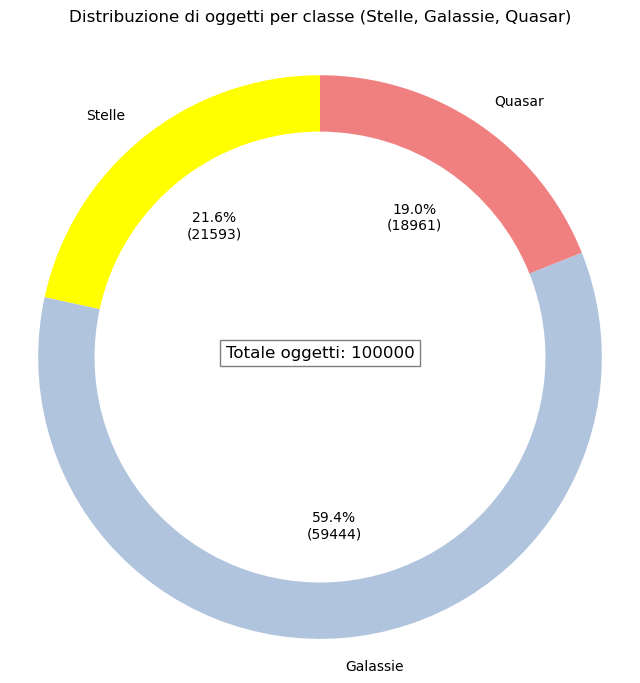

In [4]:
import pandas as pd
import matplotlib.pyplot as plt

# Conto il numero di oggetti per classe
count_star = df['label_STAR'].sum()
count_galaxy = df['label_GALAXY'].sum()
count_qso = df['label_QSO'].sum()

# Calcolo il numero totale di oggetti (verifico sia 100000)
total_objects = count_star + count_galaxy + count_qso

# Creo una lista dei valori, dei colori e dei nomi
counts = [count_star, count_galaxy, count_qso]
colors = [colori['label_STAR'], colori['label_GALAXY'], colori['label_QSO']]
labels = [nomi['label_STAR'], nomi['label_GALAXY'], nomi['label_QSO']]

# Creo il grafico a torta con un buco centrale (grafico a ciambella)
plt.figure(figsize=(8, 8))
plt.pie(
    counts, 
    labels=labels, 
    colors=colors, 
    autopct=lambda p: f'{p:.1f}%\n({int(p * sum(counts) / 100):d})', 
    startangle=90, 
    wedgeprops=dict(width=0.2)       # Buco centrale con una larghezza specificata
)

# Aggiungo titolo
plt.title('Distribuzione di oggetti per classe (Stelle, Galassie, Quasar)', pad=20)

# Aggiungo numero totale di oggetti nel grafico
plt.text(0, 0, f'Totale oggetti: {total_objects}', ha='center', fontsize=12, bbox=dict(facecolor='white', alpha=0.5))

# Imposto il grafico con la stessa proporzione per evitare che sembri ellittico
plt.axis('equal')

# Salvo l'immagine
plt.savefig('./Immagini/2.0_Percentuale_classi.png')

# Mostro il grafico
plt.show()

## <span style="color:green">2.1) Distribuzione spaziale 2D, in proiezione di Mollweide</span>

Si desidera rappresentare i 100000 oggetti sul piano del cielo, seguendo i valori di ascensione retta e declinazione (coordinate equatoriali) riportati nel file di input. Per una comprensione più immediata si rappresenta la sfera celeste in proiezione di Mollweide. Si nota come le osservazioni riguardino l'emisfero boreale (infatti il telescopio dell'SSDS si trova in USA, New Mexico).

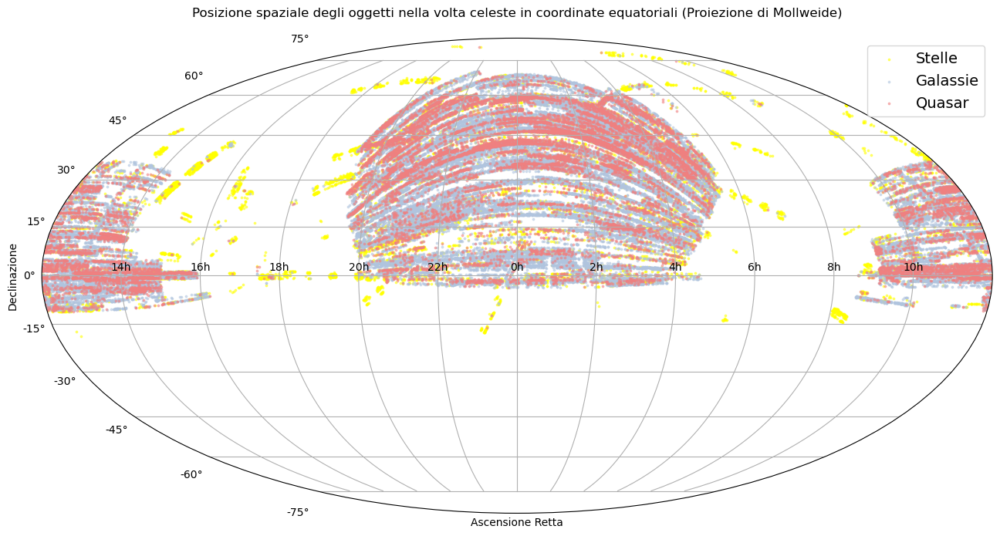

In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Converto ascensione retta (alpha) e declinazione (delta) in radianti
alpha_star = np.deg2rad(df[df['label_STAR'] == 1]['alpha']) - np.pi
delta_star = np.deg2rad(df[df['label_STAR'] == 1]['delta'])

alpha_galaxy = np.deg2rad(df[df['label_GALAXY'] == 1]['alpha']) - np.pi
delta_galaxy = np.deg2rad(df[df['label_GALAXY'] == 1]['delta'])

alpha_qso = np.deg2rad(df[df['label_QSO'] == 1]['alpha']) - np.pi
delta_qso = np.deg2rad(df[df['label_QSO'] == 1]['delta'])

# Creo la figura in proiezione di Mollweide
plt.figure(figsize=(20, 8))
ax = plt.subplot(111, projection='mollweide')

# Plot per le stelle
ax.scatter(alpha_star, delta_star, c=colori['label_STAR'], label=nomi['label_STAR'], s=3, alpha=0.5)

# Plot per le galassie
ax.scatter(alpha_galaxy, delta_galaxy, c=colori['label_GALAXY'], label=nomi['label_GALAXY'], s=3, alpha=0.5)

# Plot per i quasar
ax.scatter(alpha_qso, delta_qso, c=colori['label_QSO'], label=nomi['label_QSO'], s=3, alpha=0.5)

# Aggiungo etichette personalizzate e la legenda
ax.set_xticklabels(['14h', '16h', '18h', '20h', '22h', '0h', '2h', '4h', '6h', '8h', '10h'])
ax.set_xlabel('Ascensione Retta')
ax.set_ylabel('Declinazione')
plt.title('Posizione spaziale degli oggetti nella volta celeste in coordinate equatoriali (Proiezione di Mollweide)', pad=20)
ax.legend(loc='upper right', bbox_to_anchor=(1, 1), fontsize=14)  # Posizione della legenda

# Aggiungo griglia
ax.grid(True)

# Salvo l'immagine
plt.savefig('./Immagini/2.1_2D_Coordinate_equatoriali.png')

# Mostro il grafico
plt.show()

Inoltre, ho pensato di trasformare le coordinate equatoriali in coordinate galattiche e ripetere la rappresentazione in proiezione di Mollweide al fine di comprendere se le porzioni di cielo meno osservate (sempre per quanto riguarda l'emisfero boreale) corrispondessero al piano della Via Lattea: in effetti è così!

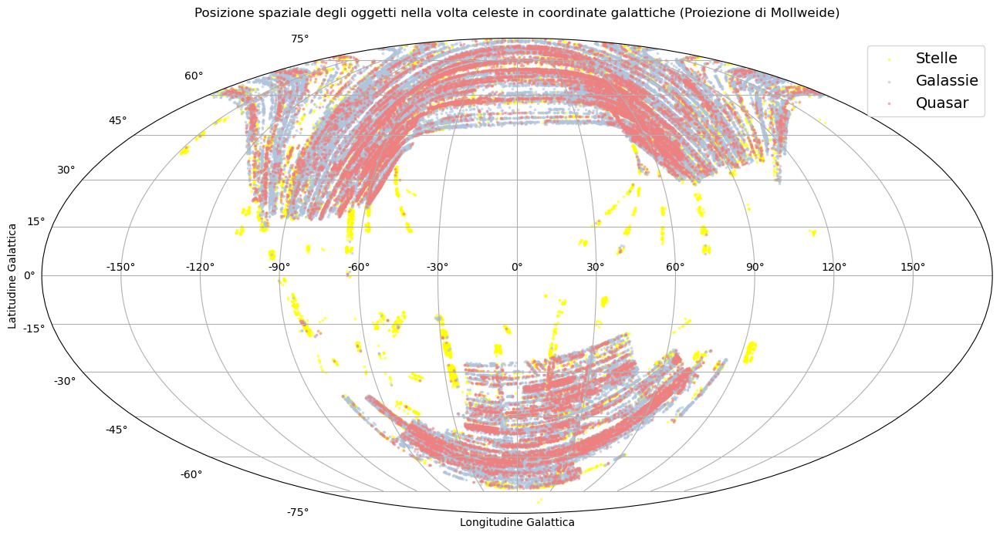

In [6]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import math

def equatorial_to_galactic(ra_deg, dec_deg):                      # Calcoli per convertire coordinate equatoriali in coordinate galattiche
    # Converto da gradi a radianti
    ra_rad = math.radians(ra_deg)
    dec_rad = math.radians(dec_deg)
    
    # Costanti per la trasformazione
    l0 = 282.859481
    b0 = 62.871180
    omega = 122.931920
    epsilon = 23.439292
    
    # Converto l'angolo dell'ascensione retta da 24 ore a gradi
    ra_deg = ra_deg * 15.0
    
    # Costanti per la trasformazione
    alpha_p = 192.859481
    delta_p = 27.128251
    epsilon_p = 22.0

    # Converto in radianti
    alpha_p_rad = math.radians(alpha_p)
    delta_p_rad = math.radians(delta_p)
    epsilon_p_rad = math.radians(epsilon_p)
    
    # Calcolo longitudine galattica
    l = math.atan2(
        math.sin(ra_rad - alpha_p_rad) * math.cos(delta_p_rad),
        math.cos(delta_p_rad) * math.sin(dec_rad) - math.sin(delta_p_rad) * math.cos(ra_rad - alpha_p_rad) * math.cos(delta_p_rad)
    )
    
    # Converto in gradi
    l_deg = math.degrees(l)
    #if l_deg < 0:
        #l_deg += 360.0
    
    # Calcolo latitudine galattica
    b = math.asin(
        math.sin(delta_p_rad) * math.sin(dec_rad) +
        math.cos(delta_p_rad) * math.cos(dec_rad) * math.cos(ra_rad - alpha_p_rad)
    )
    
    # Converto in gradi
    b_deg = math.degrees(b)
    
    return l_deg, b_deg



def convert_to_galactic(df, label):                            # Funzione per convertire ascensione retta e declinazione in coordinate galattiche
    ra_deg = df[df[label] == 1]['alpha']
    dec_deg = df[df[label] == 1]['delta']
    l, b = zip(*[equatorial_to_galactic(ra, dec) for ra, dec in zip(ra_deg, dec_deg)])
    return np.deg2rad(l), np.deg2rad(b)  # Converto in radianti per la proiezione

# Converto le coordinate
l_star, b_star = convert_to_galactic(df, 'label_STAR')
l_galaxy, b_galaxy = convert_to_galactic(df, 'label_GALAXY')
l_qso, b_qso = convert_to_galactic(df, 'label_QSO')

# Creo la figura con la proiezione Mollweide
plt.figure(figsize=(20, 8))
ax = plt.subplot(111, projection='mollweide')

# Plot per le stelle
ax.scatter(l_star, b_star, c=colori['label_STAR'], label=nomi['label_STAR'], s=3, alpha=0.5)

# Plot per le galassie
ax.scatter(l_galaxy, b_galaxy, c=colori['label_GALAXY'], label=nomi['label_GALAXY'], s=3, alpha=0.5)

# Plot per i quasar
ax.scatter(l_qso, b_qso, c=colori['label_QSO'], label=nomi['label_QSO'], s=3, alpha=0.5)

# Aggiungo etichette personalizzate e legenda
ax.set_xlabel('Longitudine Galattica')
ax.set_ylabel('Latitudine Galattica')
plt.title('Posizione spaziale degli oggetti nella volta celeste in coordinate galattiche (Proiezione di Mollweide)', pad=20)
ax.legend(loc='upper right', bbox_to_anchor=(1, 1), fontsize=14)  # Posizione della legenda

# Aggiungo griglia
ax.grid(True)

# Salvo l'immagine
plt.savefig('./Immagini/2.1_2D_Coordinate_galattiche.png')

# Mostro il grafico
plt.show()

## <span style="color:green">2.2) Dati di redshift</span>

Si desidera studiare come le varie classi di oggetti sono distribuite in funzione del loro redshift. Mi aspetto che le stelle abbiano redshift intorno allo zero (fanno parte della Via Lattea, il redshift è dovuto al moto peculiare rispetto alla Terra). Invece per le galassie e i quasar mi aspetto valori di redshift maggiori per via dell'effetto del redshift cosmologico, dato dalla maggiore distanza. 

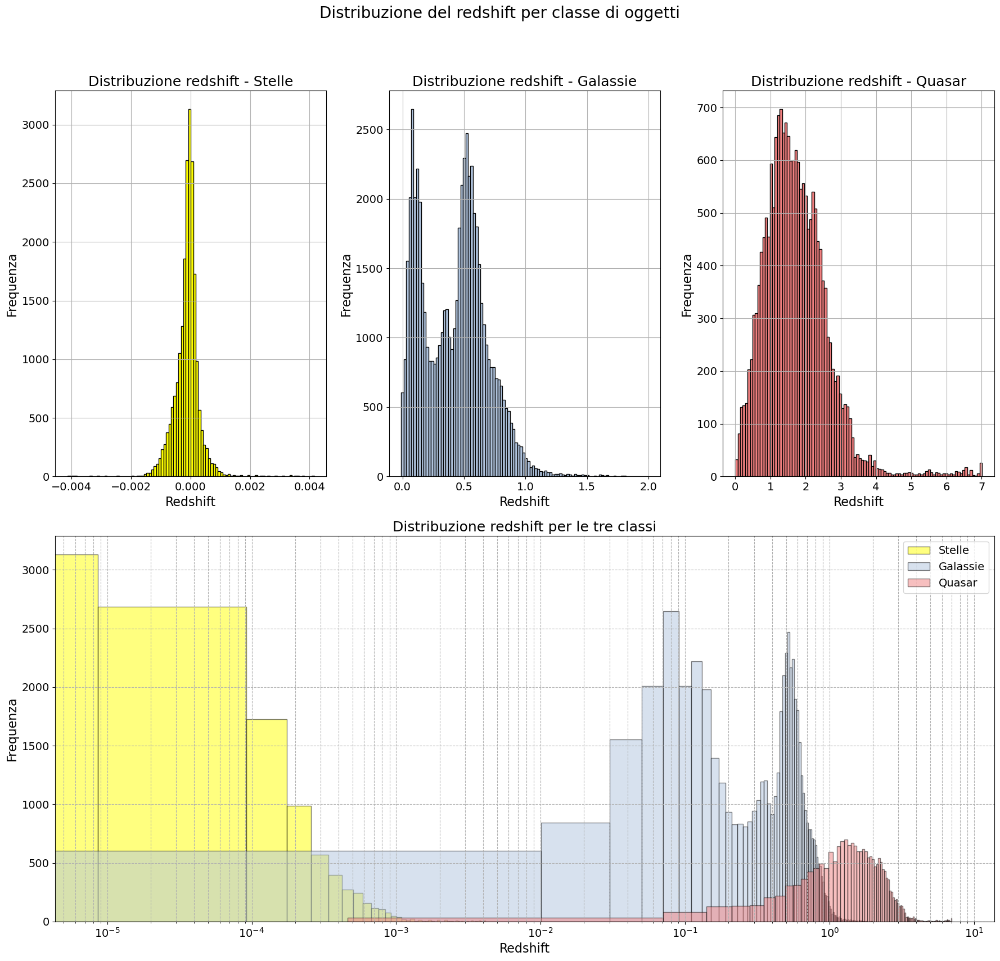

In [7]:
import pandas as pd
import matplotlib.pyplot as plt

# Creo una figura con 2 righe (3 sottografici sopra e 1 grande grafico sotto)
plt.figure(figsize=(18, 18))

# Imposto le dimensioni dei caratteri per i testi
plt.rcParams.update({'font.size': 14, 'axes.labelsize': 16, 'axes.titlesize': 18, 'legend.fontsize': 14})

# Istogramma per Stelle
df_star = df[df['label_STAR'] == 1]
plt.subplot(2, 3, 1)
plt.hist(df_star['redshift'], bins=100, color=colori['label_STAR'], edgecolor='black')
plt.xlabel('Redshift')
plt.ylabel('Frequenza')
plt.title('Distribuzione redshift - Stelle')
plt.grid(True)

# Istogramma per Galassie
df_galaxy = df[df['label_GALAXY'] == 1]
plt.subplot(2, 3, 2)
plt.hist(df_galaxy['redshift'], bins=100, color=colori['label_GALAXY'], edgecolor='black')
plt.xlabel('Redshift')
plt.ylabel('Frequenza')
plt.title('Distribuzione redshift - Galassie')
plt.grid(True)

# Istogramma per Quasar
df_qso = df[df['label_QSO'] == 1]
plt.subplot(2, 3, 3)
plt.hist(df_qso['redshift'], bins=100, color=colori['label_QSO'], edgecolor='black')
plt.xlabel('Redshift')
plt.ylabel('Frequenza')
plt.title('Distribuzione redshift - Quasar')
plt.grid(True)

# Istogramma con sovrapposizione
plt.subplot(2, 1, 2)
plt.hist(df_star['redshift'], bins=100, color=colori['label_STAR'], edgecolor='black', alpha=0.5, label=nomi['label_STAR'])
plt.hist(df_galaxy['redshift'], bins=100, color=colori['label_GALAXY'], edgecolor='black', alpha=0.5, label=nomi['label_GALAXY'])
plt.hist(df_qso['redshift'], bins=100, color=colori['label_QSO'], edgecolor='black', alpha=0.5, label=nomi['label_QSO'])
plt.xlabel('Redshift')
plt.ylabel('Frequenza')
plt.title('Distribuzione redshift per le tre classi')
plt.legend()
plt.xscale('log')  # Imposta scala logaritmica per l'asse x
plt.grid(True, which="both", ls="--")

# Aggiungo un titolo generale
plt.suptitle('Distribuzione del redshift per classe di oggetti', fontsize=20)

# Ottimizzo il layout
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

# Salvo l'immagine
plt.savefig('./Immagini/2.2_Redshift_vs_class.png')

# Mostra il grafico
plt.show()

Per le tre classi, decido di effettuare un grafico 3D con ascensione retta, declinazione e redshift portate in coordinate cartesiane. Nella trasformazione da coordinate sferiche (RA, DEC, redshift) a cartesiane (X, Y, Z), ho considerato il redshift come indice della distanza dall'origine (la Terra). Questa equiparazione è sensata per i quasar e le galassie più lontane, dove prevale il redshift di tipo cosmologico. Invece per le galassie più vicine può avere rilevanza non trascurabile il redshift dato dal moto peculiare, che inficia la comparazione "redshift=distanza". Per le stelle la totalità del redshift è data dal moto peculiare: il grafico va inteso come una rappresentazione 3D della proiezione di Mollweide del punto 2.1), dove "il segno" della distanza dall'origine indica se una stella si sta avvicinando o allontanando dalla Terra, mentre il modulo della distanza indica la sua velocità.

Mi serve escludere il dato errato altrimenti sballa i grafici

In [2]:
# Leggo il DataFrame rielaborato e filtrato
input_file = 'dataset_rielaborato_filtrato.csv'
df_F = pd.read_csv(input_file)

print("File letto!")

File letto!


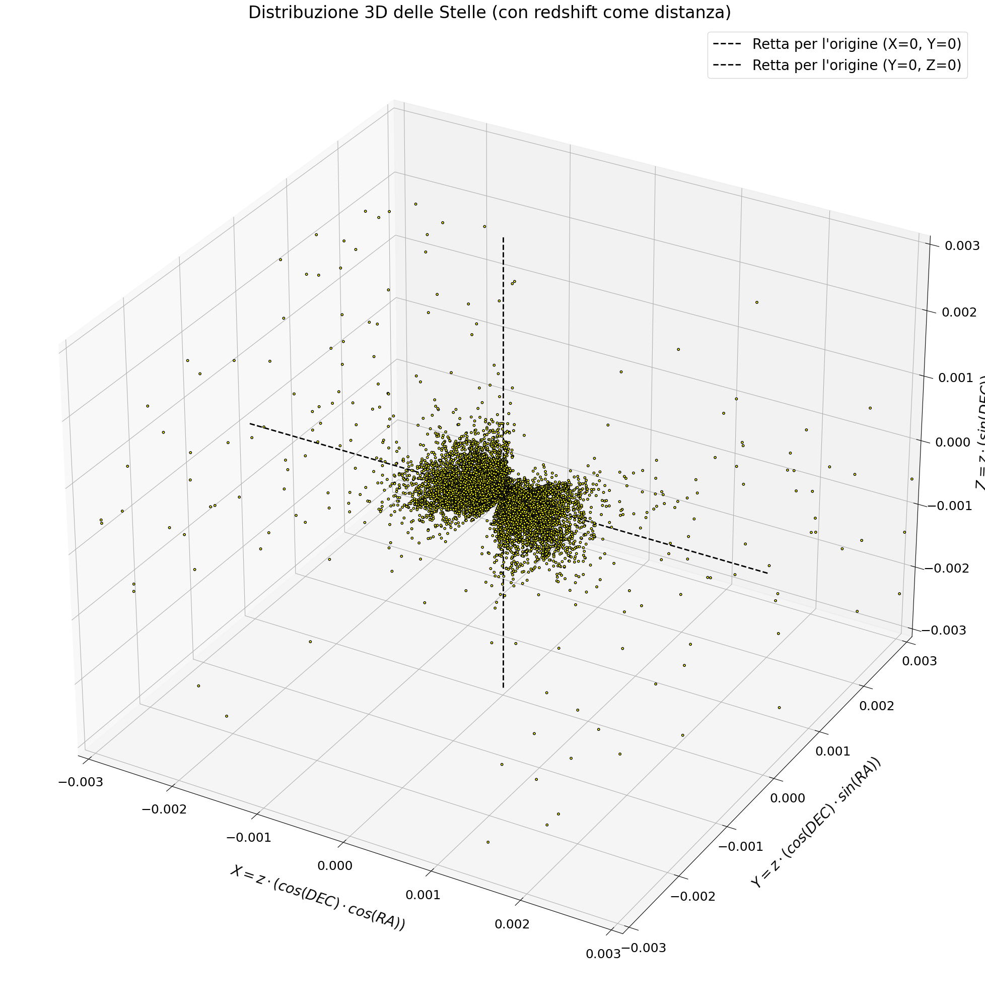

In [59]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Filtro solo le galassie
df_stelle = df_F[df_F['label_STAR'] == 1]

# Converto RA e DEC in radianti
ra_rad = np.deg2rad(df_stelle['alpha'])     # Ascensione retta in radianti
dec_rad = np.deg2rad(df_stelle['delta'])    # Declinazione in radianti

# Uso il redshift come distanza
r = df_stelle['redshift']  

# Converto da coordinate sferiche a cartesiane
x = r * np.cos(dec_rad) * np.cos(ra_rad)
y = r * np.cos(dec_rad) * np.sin(ra_rad)
z = r * np.sin(dec_rad)

# Creo grafico 3D
fig = plt.figure(figsize=(28,25))
ax = fig.add_subplot(111, projection='3d')

# Imposto una dimensione di font globale 
plt.rcParams.update({'font.size': 18}) 

# Plotto i punti delle galassie
ax.scatter(x, y, z, c=colori['label_STAR'], s=10, alpha=1, edgecolor='black')

# Disegno la retta (0,0,Z)
z_min, z_max = ax.get_zlim()  # Limiti attuali dell'asse Z
ax.plot([0, 0], [0, 0], [-0.003, z_max], color='black', linewidth=2, linestyle='--', label='Retta per l\'origine (X=0, Y=0)')

# Disegno la retta (X,0,0)
ax.plot([-0.003, 0.003], [0, 0], [0, 0], color='black', linewidth=2, linestyle='--', label='Retta per l\'origine (Y=0, Z=0)')

# Aggiungo etichette agli assi
ax.set_xlabel(r'$X = z \cdot (cos(DEC) \cdot cos(RA))$', labelpad=35, fontsize = 20)
ax.set_ylabel(r'$Y = z \cdot (cos(DEC) \cdot sin(RA))$', labelpad=35, fontsize = 20)
ax.set_zlabel(r'$Z = z \cdot (sin(DEC))$', labelpad=35, fontsize = 20)
ax.set_title('Distribuzione 3D delle Stelle (con redshift come distanza)', pad=10, fontsize=24)

# Aumento lo spazio tra i riferimenti numerici sugli assi e gli assi stessi
ax.tick_params(axis='x', pad=10)
ax.tick_params(axis='y', pad=10)
ax.tick_params(axis='z', pad=20) 

# Imposto i limiti per gli assi
ax.set_xlim(-0.003, 0.003)  
ax.set_ylim(-0.003, 0.003) 
ax.set_zlim(-0.003, 0.003) 

# Mostro la legenda
ax.legend(fontsize=20)

# Salvo l'immagine
plt.savefig('./Immagini/2.2_3D_stars.png')

# Mostro il grafico
plt.show()


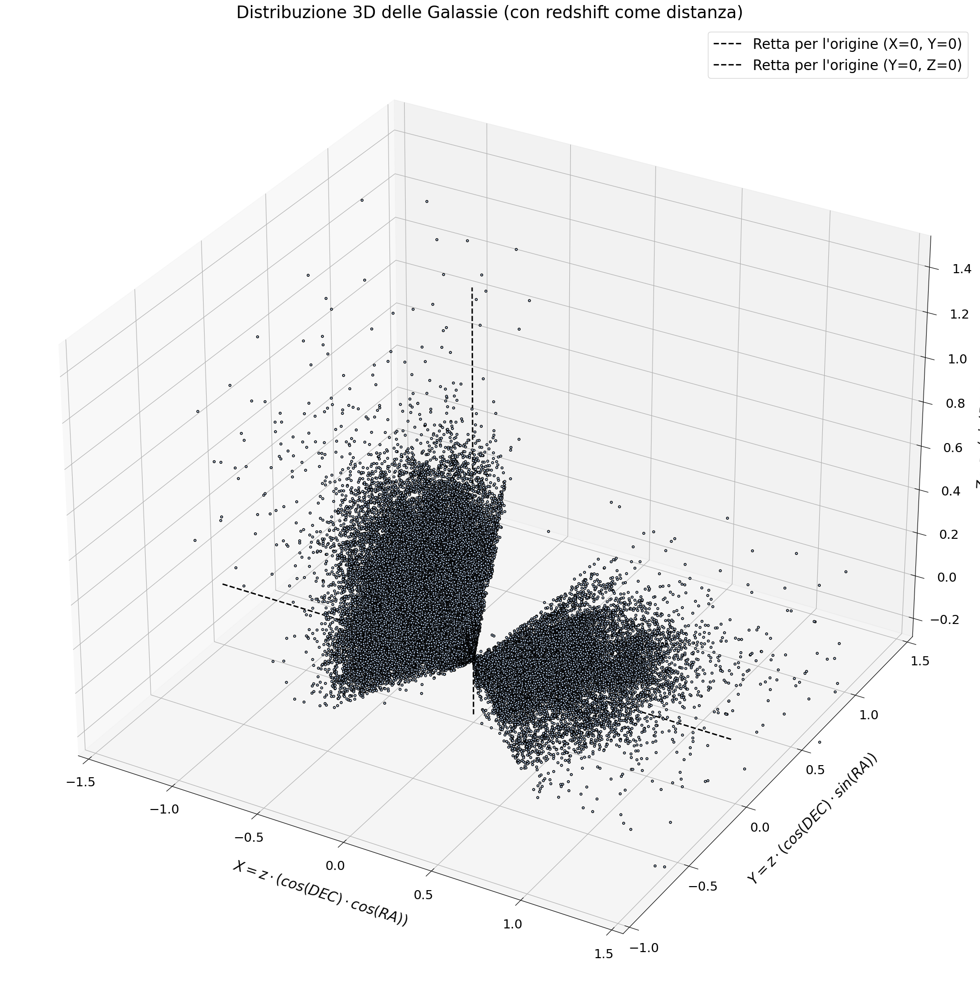

In [55]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Filtro solo le galassie
df_galassie = df[df['label_GALAXY'] == 1]

# Converto RA e DEC in radianti
ra_rad = np.deg2rad(df_galassie['alpha'])     # Ascensione retta in radianti
dec_rad = np.deg2rad(df_galassie['delta'])    # Declinazione in radianti

# Uso il redshift come distanza
r = df_galassie['redshift']  

# Converto da coordinate sferiche a cartesiane
x = r * np.cos(dec_rad) * np.cos(ra_rad)
y = r * np.cos(dec_rad) * np.sin(ra_rad)
z = r * np.sin(dec_rad)

# Creazione del grafico 3D
fig = plt.figure(figsize=(28,25))
ax = fig.add_subplot(111, projection='3d')

# Imposto una dimensione di font globale 
plt.rcParams.update({'font.size': 18}) 

# Plotto i punti delle galassie
ax.scatter(x, y, z, c=colori['label_GALAXY'], s=10, alpha=1, edgecolor='black')

# Disegno la retta (0,0,Z) 
z_min, z_max = ax.get_zlim()  # Ottiene i limiti attuali dell'asse Z
ax.plot([0, 0], [0, 0], [z_min, z_max], color='black', linewidth=2, linestyle='--', label='Retta per l\'origine (X=0, Y=0)')

# Disegno la retta (X,0,0)
x_min, x_max = ax.get_xlim()  # Ottiene i limiti attuali dell'asse X
ax.plot([-1.5, x_max-0.5], [0, 0], [0, 0], color='black', linewidth=2, linestyle='--', label='Retta per l\'origine (Y=0, Z=0)')

# Aggiungo etichette agli assi
ax.set_xlabel(r'$X = z \cdot (cos(DEC) \cdot cos(RA))$', labelpad=30, fontsize = 20)
ax.set_ylabel(r'$Y = z \cdot (cos(DEC) \cdot sin(RA))$', labelpad=30, fontsize = 20)
ax.set_zlabel(r'$Z = z \cdot (sin(DEC))$', labelpad=35, fontsize = 20)
ax.set_title('Distribuzione 3D delle Galassie (con redshift come distanza)', pad=10, fontsize=24)

# Mostro la legenda
ax.legend(fontsize=20)

# Aumento lo spazio tra i riferimenti numerici sugli assi e gli assi stessi
ax.tick_params(axis='x', pad=10) 
ax.tick_params(axis='y', pad=10)  
ax.tick_params(axis='z', pad=20)  

# Imposto i limiti per gli assi
ax.set_xlim(-1.5, 1.5) 
ax.set_ylim(-1, 1.5)  
ax.set_zlim(-0.25, 1.5) 

# Salvo l'immagine
plt.savefig('./Immagini/2.2_3D_galaxies.png')

# Mostro il grafico
plt.show()


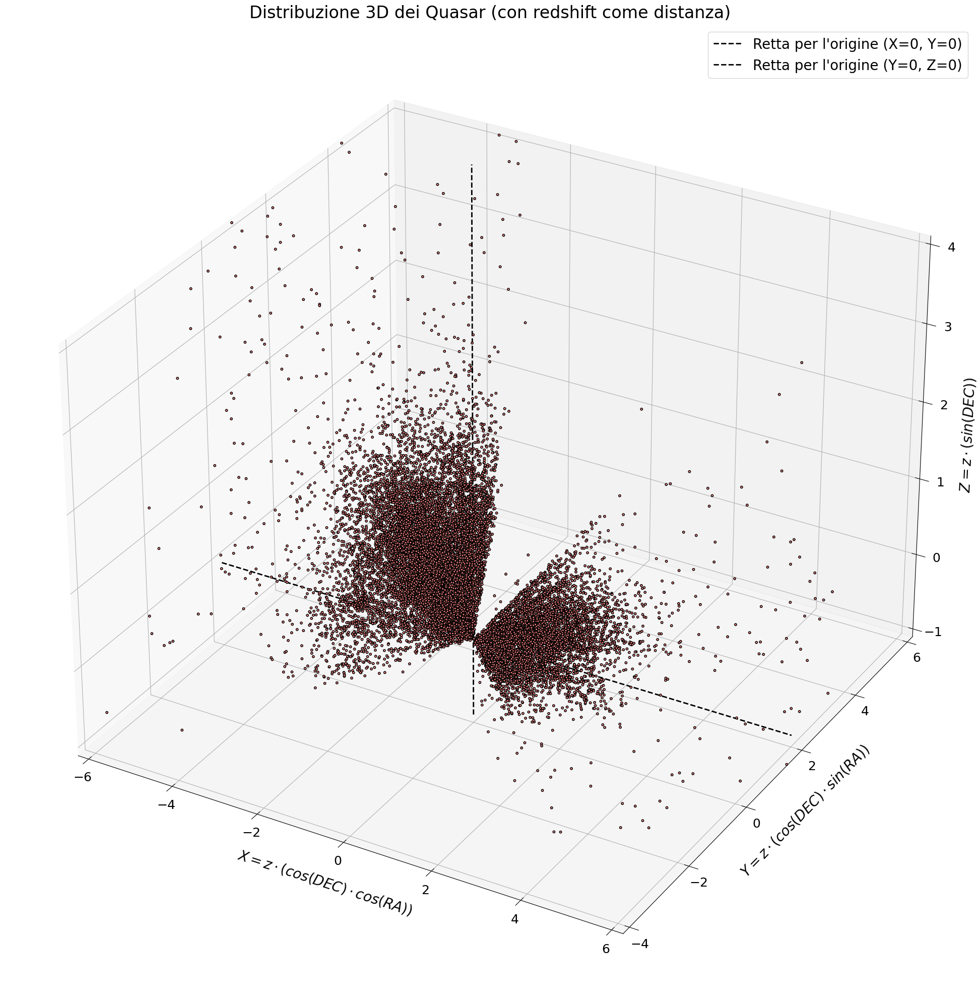

In [58]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Filtro solo le galassie
df_qso = df[df['label_QSO'] == 1]

# Converto RA e DEC in radianti
ra_rad = np.deg2rad(df_qso['alpha'])     # Ascensione retta in radianti
dec_rad = np.deg2rad(df_qso['delta'])    # Declinazione in radianti

# Uso il redshift come distanza
r = df_qso['redshift']  

# Converto da coordinate sferiche a cartesiane
x = r * np.cos(dec_rad) * np.cos(ra_rad)
y = r * np.cos(dec_rad) * np.sin(ra_rad)
z = r * np.sin(dec_rad)

# Creazione del grafico 3D
fig = plt.figure(figsize=(28,25))
ax = fig.add_subplot(111, projection='3d')

# Imposto una dimensione di font globale 
plt.rcParams.update({'font.size': 18})  

# Plotto i punti delle galassie
ax.scatter(x, y, z, c=colori['label_QSO'], s=10, alpha=1, edgecolor='black')

# Disegno la retta (0,0,Z) 
z_min, z_max = ax.get_zlim()  # Ottiene i limiti attuali dell'asse Z
ax.plot([0, 0], [0, 0], [-1, z_max], color='black', linewidth=2, linestyle='--', label='Retta per l\'origine (X=0, Y=0)')

# Disegno la retta (X,0,0)
x_min, x_max = ax.get_xlim()  # Ottiene i limiti attuali dell'asse X
ax.plot([-6, x_max-0.5], [0, 0], [0, 0], color='black', linewidth=2, linestyle='--', label='Retta per l\'origine (Y=0, Z=0)')


# Aggiungo etichette agli assi
ax.set_xlabel(r'$X = z \cdot (cos(DEC) \cdot cos(RA))$', labelpad=20, fontsize = 20)
ax.set_ylabel(r'$Y = z \cdot (cos(DEC) \cdot sin(RA))$', labelpad=20, fontsize = 20)
ax.set_zlabel(r'$Z = z \cdot (sin(DEC))$', labelpad=20, fontsize = 20)
ax.set_title('Distribuzione 3D dei Quasar (con redshift come distanza)', pad=10, fontsize=24)

# Mostro la legenda
ax.legend(fontsize=20)

# Aumento lo spazio tra i riferimenti numerici sugli assi e gli assi stessi
ax.tick_params(axis='x', pad=5) 
ax.tick_params(axis='y', pad=5)  
ax.tick_params(axis='z', pad=10)  

# Imposto i limiti per gli assi
ax.set_xlim(-6, 6) 
ax.set_ylim(-4, 6) 
ax.set_zlim(-1, 4)  

# Salvo l'immagine
plt.savefig('./Immagini/2.2_3D_quasars.png')

# Mostro il grafico
plt.show()


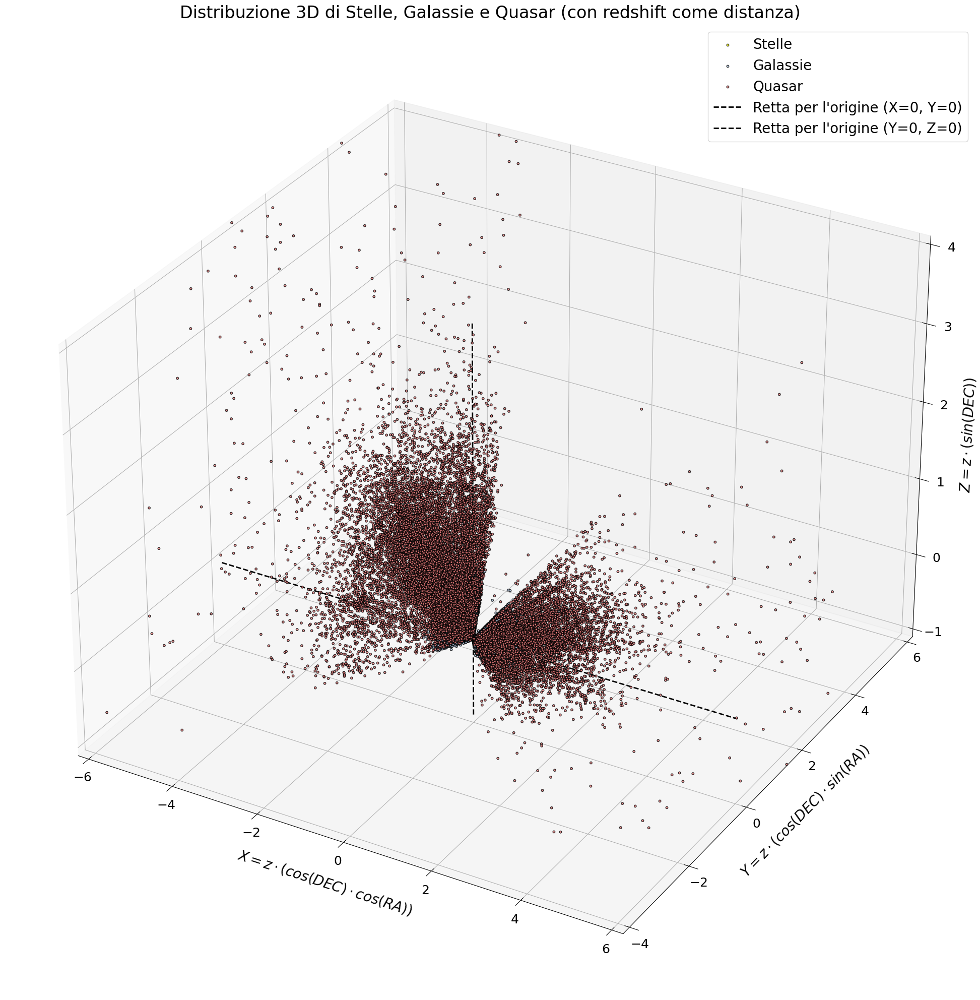

In [64]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Funzione per convertire coordinate sferiche in cartesiane
def convert_to_cartesian(df):
    ra_rad = np.deg2rad(df['alpha'])     # Ascensione retta in radianti
    dec_rad = np.deg2rad(df['delta'])    # Declinazione in radianti
    r = df['redshift']                   # Redshift come distanza
    x = r * np.cos(dec_rad) * np.cos(ra_rad)
    y = r * np.cos(dec_rad) * np.sin(ra_rad)
    z = r * np.sin(dec_rad)
    return x, y, z

# Dati per ciascuna classe
df_stelle = df_F[df_F['label_STAR'] == 1]
df_galassie = df_F[df_F['label_GALAXY'] == 1]
df_quasar = df_F[df_F['label_QSO'] == 1]

# Converto le coordinate per ogni classe
x_stelle, y_stelle, z_stelle = convert_to_cartesian(df_stelle)
x_galassie, y_galassie, z_galassie = convert_to_cartesian(df_galassie)
x_quasar, y_quasar, z_quasar = convert_to_cartesian(df_quasar)

# Creazione del grafico 3D
fig = plt.figure(figsize=(28,25))
ax = fig.add_subplot(111, projection='3d')

# Imposto una dimensione di font globale 
plt.rcParams.update({'font.size': 18})  

# Plotto i punti per ciascuna classe con colori diversi
ax.scatter(x_stelle, y_stelle, z_stelle, c=colori['label_STAR'], s=10, alpha=0.8, edgecolor='black', label=nomi['label_STAR'])
ax.scatter(x_galassie, y_galassie, z_galassie, c=colori['label_GALAXY'], s=10, alpha=0.8, edgecolor='black', label=nomi['label_GALAXY'])
ax.scatter(x_quasar, y_quasar, z_quasar, c=colori['label_QSO'], s=10, alpha=0.8, edgecolor='black', label=nomi['label_QSO'])

# Disegno la retta (0,0,Z)
z_min, z_max = ax.get_zlim()  # Ottiene i limiti attuali dell'asse Z
ax.plot([0, 0], [0, 0], [-1, 4], color='black', linewidth=2, linestyle='--', label='Retta per l\'origine (X=0, Y=0)')

# Disegno la retta (X,0,0)
x_min, x_max = ax.get_xlim()  # Ottiene i limiti attuali dell'asse X
ax.plot([-6, 6], [0, 0], [0, 0], color='black', linewidth=2, linestyle='--', label='Retta per l\'origine (Y=0, Z=0)')

# Aggiungo etichette agli assi
ax.set_xlabel(r'$X = z \cdot (cos(DEC) \cdot cos(RA))$', labelpad=20, fontsize=20)
ax.set_ylabel(r'$Y = z \cdot (cos(DEC) \cdot sin(RA))$', labelpad=20, fontsize=20)
ax.set_zlabel(r'$Z = z \cdot (sin(DEC))$', labelpad=20, fontsize=20)
ax.set_title('Distribuzione 3D di Stelle, Galassie e Quasar (con redshift come distanza)', pad=10, fontsize=24)

# Mostro la legenda
ax.legend(fontsize=20)

# Aumento lo spazio tra i riferimenti numerici sugli assi e gli assi stessi
ax.tick_params(axis='x', pad=5)  
ax.tick_params(axis='y', pad=5)  
ax.tick_params(axis='z', pad=10)  

# Imposto i limiti per gli assi
ax.set_xlim(-6, 6)  
ax.set_ylim(-4, 6)  
ax.set_zlim(-1, 4) 

# Salvo l'immagine
plt.savefig('./Immagini/2.2_3D_all.png')

# Mostro il grafico
plt.show()

## <span style="color:green"> 2.3) Dati fotometrici </span>

Si desidera studiare i valori dei 5 filtri (u, g, r, i, z) per le tre diverse classi di oggetti.

--Commento qualitativo--  
Dai primi istogrammi si evince qualitativamente come stelle e quasar siano più facilmente distinguibili prendendo in considerazione solo i dati dei 5 filtri fotometrici. I dati delle galassie presentano invece un profilo a due picchi (quindi, due gruppi di galassie - verosimilmente spirali ed ellittiche), il cui primo picco si sovrappone - a grandi linee - al profilo delle stelle, mentre il secondo al profilo dei quasar.

Come già specificato prima, nell'esecuzione di questo punto mi sono accorto della presenza di un dato errato. In particolare un oggetto della classe stella risulta avere valori molto negativi (dell'ordine di -10000) per i soli filtri u, g, z. Sospetto si tratti di un errore di lettura dello strumento o di copiatura dei valori. Ergo ho provveduto a creare un nuovo dataset escludendo questo valore, per non inficiare la qualità dei grafici (aumentando a dismisura il range per includere il dato errato diventano illeggibili).

In [12]:
# Filtro le righe dove il valore del filtro 'u' è inferiore a zero
df_negative_u = df[df['u'] < 0]

# Stampo le righe con 'u' < 0
print("Dato errato estratto dal dataset rielaborato:")
print(df_negative_u)

Dato errato estratto dal dataset rielaborato:
       label_GALAXY  label_QSO  label_STAR       alpha     delta  redshift  \
79543         False      False        True  224.006526 -0.624304  0.000089   

            u       g        r         i       z  run_ID  rerun_ID  cam_col  \
79543 -9999.0 -9999.0  18.1656  18.01675 -9999.0     752       301        2   

       field_ID  plate  fiber_ID    MJD        obj_ID   spec_obj_ID  
79543       537   3314       162  54970  1.237649e+18  3.731277e+18  


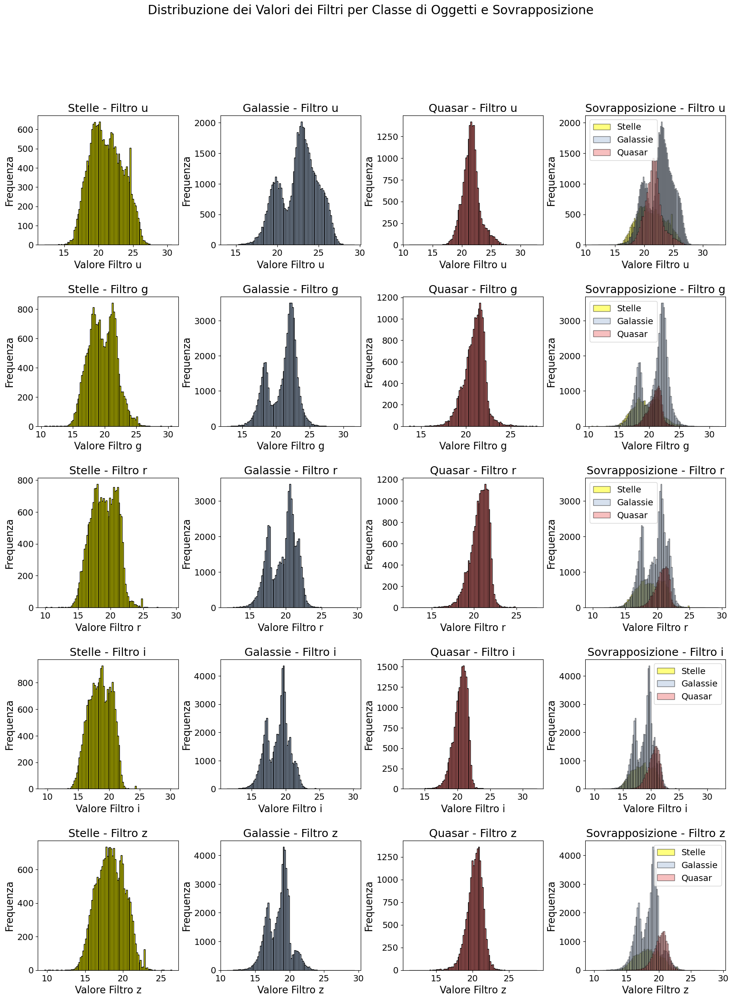

In [13]:
import pandas as pd
import matplotlib.pyplot as plt

# Creo una figura con una griglia 5x4 (5 filtri e 4 colonne: 3 classi di oggetti + 1 sovrapposizione)
fig, axs = plt.subplots(5, 4, figsize=(20, 25))
fig.subplots_adjust(hspace=0.4, wspace=0.3)

# Ciclo attraverso i filtri e le classi per creare gli istogrammi
for i, filtro in enumerate(filtri):
    
    # Filtro i dati per stelle, galassie e quasar
    df_star = df_F[df_F['label_STAR'] == 1][filtro]
    df_galaxy = df_F[df_F['label_GALAXY'] == 1][filtro]
    df_qso = df_F[df_F['label_QSO'] == 1][filtro]

    # Istogramma per Stelle
    axs[i, 0].hist(df_star, bins=100, color=colori['label_STAR'], edgecolor='black')
    axs[i, 0].set_title(f'Stelle - Filtro {filtro}')
    axs[i, 0].set_xlabel(f'Valore Filtro {filtro}')
    axs[i, 0].set_ylabel('Frequenza')
    
    # Istogramma per Galassie
    axs[i, 1].hist(df_galaxy, bins=100, color=colori['label_GALAXY'], edgecolor='black')
    axs[i, 1].set_title(f'Galassie - Filtro {filtro}')
    axs[i, 1].set_xlabel(f'Valore Filtro {filtro}')
    axs[i, 1].set_ylabel('Frequenza')
    
    # Istogramma per Quasar
    axs[i, 2].hist(df_qso, bins=100, color=colori['label_QSO'], edgecolor='black')
    axs[i, 2].set_title(f'Quasar - Filtro {filtro}')
    axs[i, 2].set_xlabel(f'Valore Filtro {filtro}')
    axs[i, 2].set_ylabel('Frequenza')

    # Sovrapposizione dei tre istogrammi
    axs[i, 3].hist(df_star, bins=100, color=colori['label_STAR'], edgecolor='black', alpha=0.5, label=nomi['label_STAR'])
    axs[i, 3].hist(df_galaxy, bins=100, color=colori['label_GALAXY'], edgecolor='black', alpha=0.5, label=nomi['label_GALAXY'])
    axs[i, 3].hist(df_qso, bins=100, color=colori['label_QSO'], edgecolor='black', alpha=0.5, label=nomi['label_QSO'])
    axs[i, 3].set_title(f'Sovrapposizione - Filtro {filtro}')
    axs[i, 3].set_xlabel(f'Valore Filtro {filtro}')
    axs[i, 3].set_ylabel('Frequenza')
    axs[i, 3].legend()

# Aggiungo un titolo generale
plt.suptitle('Distribuzione dei Valori dei Filtri per Classe di Oggetti e Sovrapposizione', fontsize=20)

# Salvo l'immagine
plt.savefig('./Immagini/2.3_Filters_vs_class.png')

# Mostra il grafico
plt.show()

Inoltre, decido di rappresentare tramite degli scatterplot la correlazione tra i filtri. In questi grafici si osserva che il grado di correlazione tra i diversi filtri è importante soprattutto a basse magnitudini (maggiore luminosità) e per filtri contigui. Tale evidenza mi induce a pensare che in fase di allenamento della rete neurale potrei non considerare alcuni filtri (ad esempio provando a considerare solo u, r, z).

<Figure size 2000x1800 with 0 Axes>

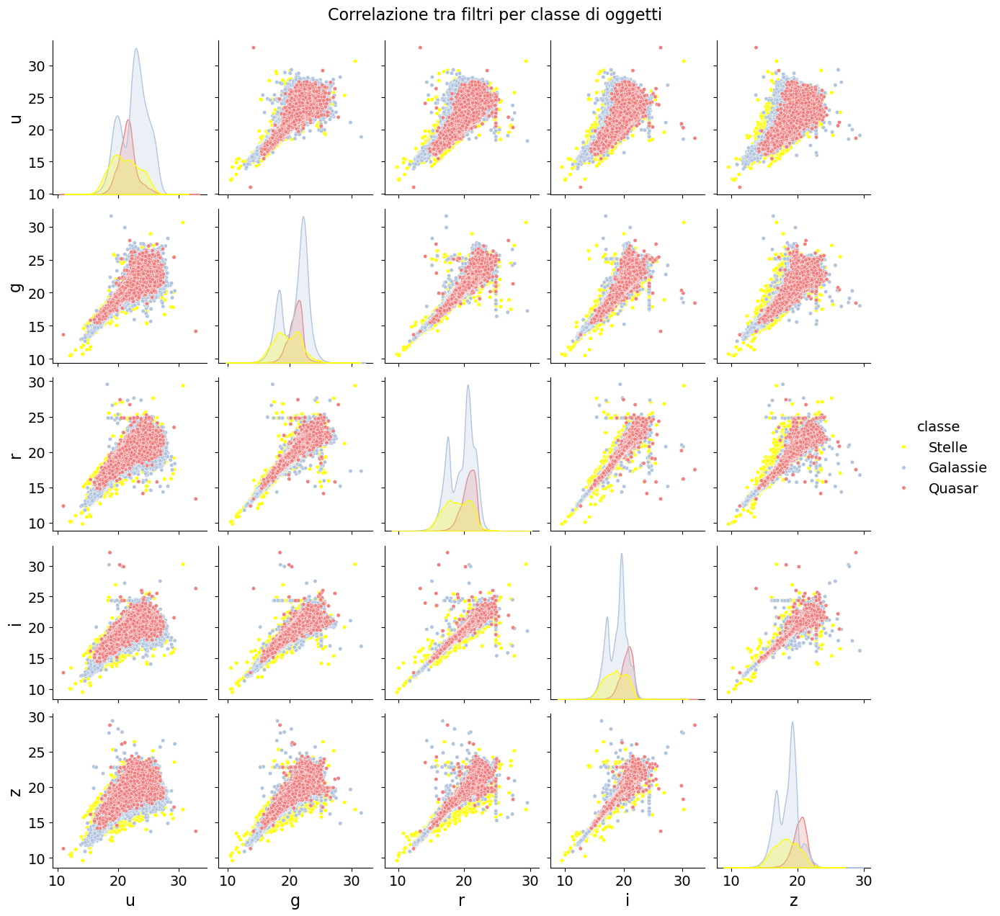

In [14]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Seleziono solo le colonne dei filtri e della classe
df_utile = df_F[filtri + classi]

# Converto le colonne delle classi in una colonna unica 'class'
df_melted = df_utile.melt(id_vars=filtri, var_name='class_type', value_name='class_value')

# Mappo la colonna 'class_value' a una sola colonna 'class'
df_melted['classe'] = df_melted['class_type'].apply(lambda x: 'Stelle' if x == 'label_STAR' else ('Galassie' if x == 'label_GALAXY' else 'Quasar'))

# Filtro solo le righe dove 'class_value' è 1
df_melted = df_melted[df_melted['class_value'] == 1].drop(columns=['class_value', 'class_type'])

# Definisco le dimensioni della figura
plt.figure(figsize=(20, 18))

# Creo un pairplot con dimensione dei punti, trasparenza e contorno personalizzati
sns.pairplot(
    df_melted, 
    hue='classe', 
    palette={'Stelle': 'yellow', 'Galassie': 'lightsteelblue', 'Quasar': 'lightcoral'},
    plot_kws={'s': 15, 'alpha': 1, 'edgecolor': 'white'}  # Imposto grandezza, trasparenza e contorno
)

plt.suptitle('Correlazione tra filtri per classe di oggetti', y=1.02, fontsize=16)

# Salvo l'immagine
plt.savefig('./Immagini/2.3_Filters_correlation.png')

# Mostro il grafico
plt.show()


## 2.4) Correlazione tra filtri e redshift

Rappresento qui la relazione tra i 5 filtri e il valore del redshift al fine di osservare qualitativamente se esiste correlazione.

--Commento--  
Nei grafici riferiti alle galassie si nota come le galassie più luminose (minore magnitudine apparente) sono quelle a più basso redshift (quindi più vicine)

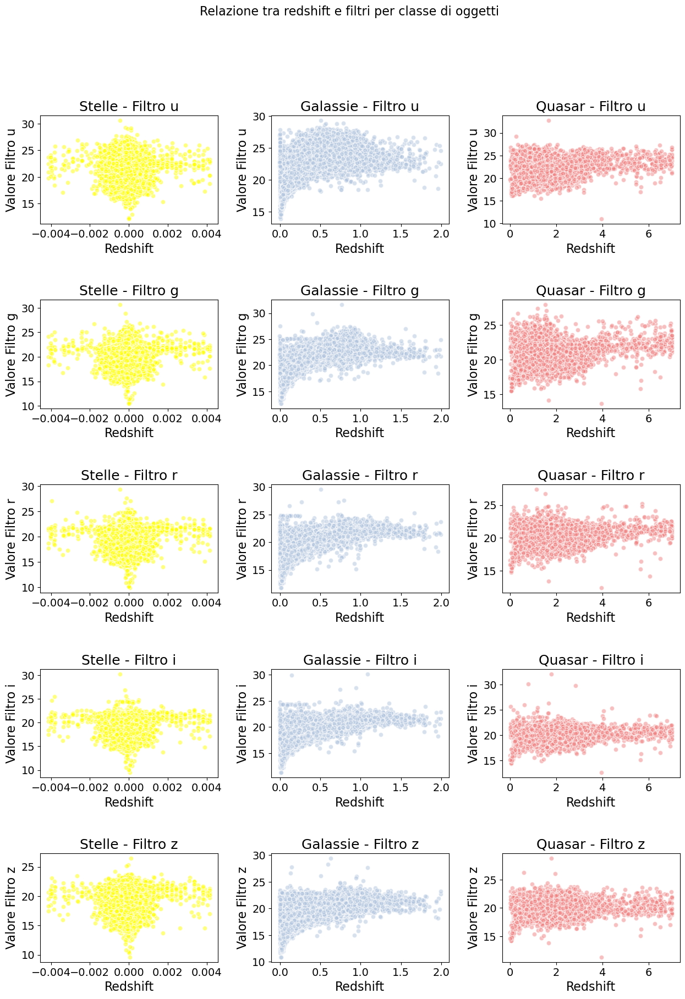

In [15]:
import pandas as pd
import matplotlib.pyplot as plt

# Creo una figura con una griglia 5x3
fig, axs = plt.subplots(5, 3, figsize=(15, 20))
fig.subplots_adjust(hspace=0.7, wspace=0.3)

# Ciclo attraverso i filtri e le classi per creare gli scatterplot
for i, filtro in enumerate(filtri):
    for j, classe in enumerate(classi):
        # Filtro i dati per la classe
        df_class = df_F[df_F[classe] == 1]
        
        # Creo lo scatterplot
        axs[i, j].scatter(df_class['redshift'], df_class[filtro], 
                          color=colori[classe], edgecolor='white', alpha=0.5)
        axs[i, j].set_title(f'{nomi[classe]} - Filtro {filtro}')
        axs[i, j].set_xlabel('Redshift')
        axs[i, j].set_ylabel(f'Valore Filtro {filtro}')
        
# Titolo generale
plt.suptitle('Relazione tra redshift e filtri per classe di oggetti', fontsize=16)

# Salvo l'immagine
plt.savefig('./Immagini/2.4_Filters_vs_redshift.png')

# Mostro il grafico
plt.show()

## 2.5) Matrice di correlazione

Per studiare QUANTITATIVAMENTE quanto due grandezze sono correlate nel loro andamento uso la matrice di correlazione.  
La correlazione tra una classe (come, ad esempio, "Stelle") e un filtro (come "u") viene calcolata utilizzando il coefficiente di correlazione di Pearson. Questo coefficiente misura quanto e in che direzione c'è una relazione lineare tra due variabili.  

Il coefficiente di correlazione di Pearson ($r$) tra due variabili $X$ e $Y$ è calcolato come:
$$ r = \frac{Cov(X,Y)}{\sigma_X \cdot \sigma_Y}$$
dove $Cov$ è la covarianza e $\sigma$ la deviazione standard

La correlazione di Pearson tra la variabile binaria "Stelle" e il filtro continuo "u" misura quanto i valori del filtro "u" tendano ad essere alti o bassi per gli oggetti classificati come stelle, rispetto agli altri. Un valore positivo indica che i valori del filtro "u" tendono ad essere più alti per gli oggetti classificati come stelle, mentre un valore negativo indica che tendono ad essere più bassi.  
Infatti: per le stelle ho i coefficienti di correlazione di tutti i filtri negativi, ovvero la luminosità delle stelle è maggiore di quella degli altri corpi: vero!

Interpretazione del coefficiente di correlazione (r):  
$r$ vicino a 1: Forte correlazione positiva (i valori del filtro "u" sono generalmente più alti per le stelle).  
$r$ vicino a -1: Forte correlazione negativa (i valori del filtro "u" sono generalmente più bassi per le stelle).  
$r$ vicino a 0: Nessuna correlazione lineare evidente tra la classe e il filtro.  

Nota: ho inserito in questa matrice anche i valori dell'ascensione retta e della declinazione per verificare che la classificazione non ne dipendesse. Infatti è così: $r\simeq 0$ per tutte e tre le classi.

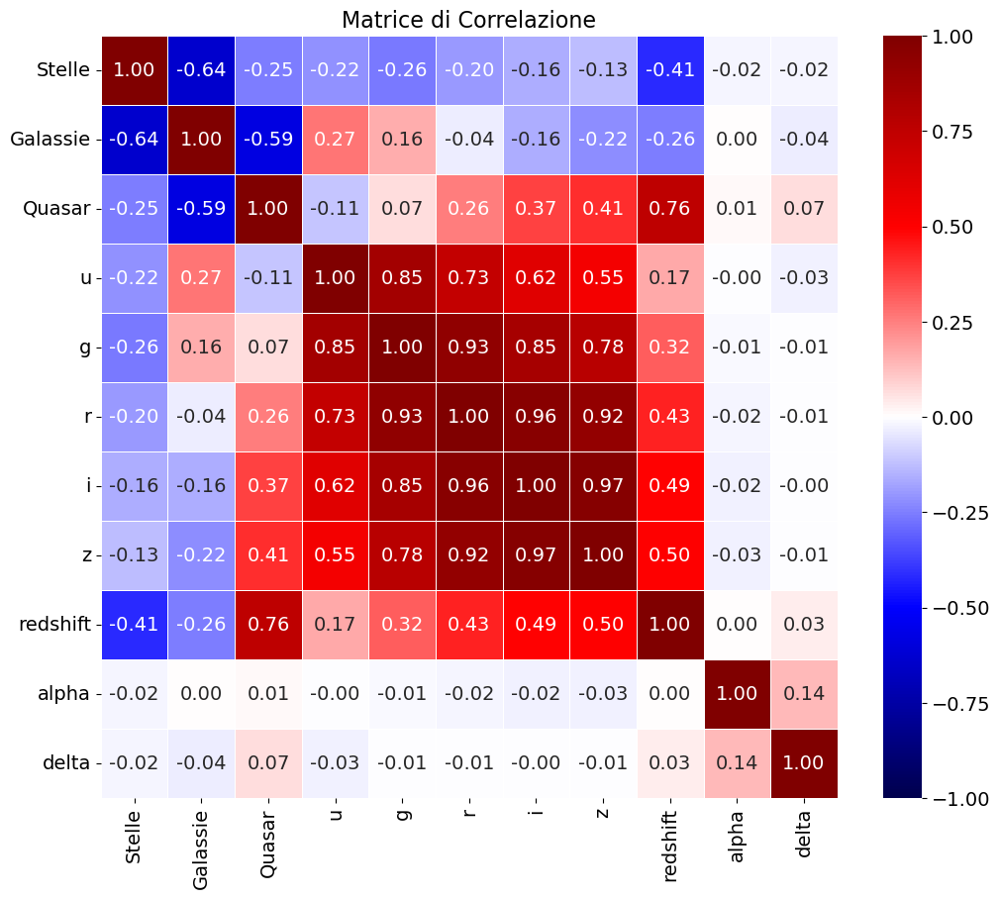

In [16]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Preparo i dati per la matrice di correlazione
df_corr = df_F.copy()

# Converto le classi in numeri binari (0 o 1)
df_corr[classi] = df_corr[classi].astype(int)

# Seleziono le colonne da includere nella matrice di correlazione
columns_to_include = classi + filtri + ['redshift', 'alpha', 'delta']
df_corr = df_corr[columns_to_include]

# Calcolo la matrice di correlazione
correlation_matrix = df_corr.corr()

# Rinomino le colonne e le righe della matrice di correlazione
correlation_matrix.rename(columns=nomi, index=nomi, inplace=True)

# Creo una mappa di calore per visualizzare la matrice di correlazione
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='seismic', fmt='.2f', linewidths=0.5, 
            vmin=-1, vmax=+1)
plt.title('Matrice di Correlazione', fontsize=16)

# Salvo l'immagine
plt.savefig('./Immagini/2.5_Correlation_matrix.png')

# Mostro il grafico
plt.show()

Calcolo la matrice di correlazione anche per gli indici di colore (10 possibili combinazion) che potrebbero tornare utili nella fase successiva, perché NON dipendenti dalla distanza (a patto di trascurare l'assorbimento interstellare e intergalattico).

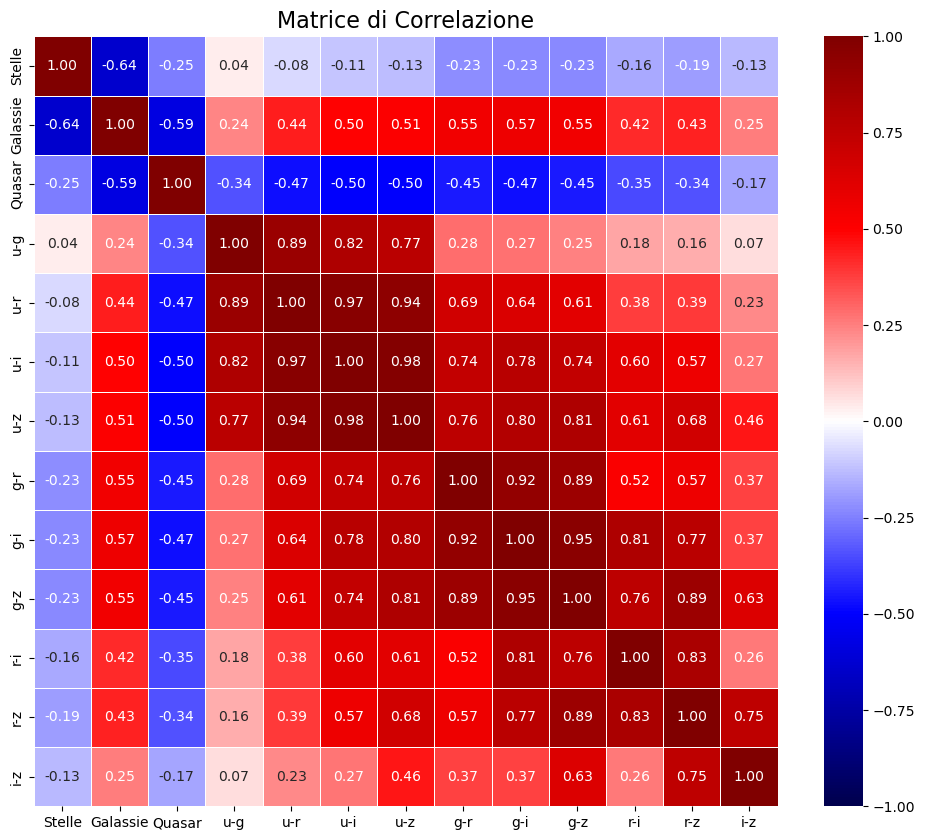

In [6]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Preparo i dati per la matrice di correlazione
df_corre = df_F.copy()

# Combinazioni di indici di colore
df_corre['u-g'] = df_corre['u'] - df_corre['g']
df_corre['u-r'] = df_corre['u'] - df_corre['r']
df_corre['u-i'] = df_corre['u'] - df_corre['i']
df_corre['u-z'] = df_corre['u'] - df_corre['z']

df_corre['g-r'] = df_corre['g'] - df_corre['r']
df_corre['g-i'] = df_corre['g'] - df_corre['i']
df_corre['g-z'] = df_corre['g'] - df_corre['z']

df_corre['r-i'] = df_corre['r'] - df_corre['i']
df_corre['r-z'] = df_corre['r'] - df_corre['z']

df_corre['i-z'] = df_corre['i'] - df_corre['z']

indici_colore = ['u-g', 'u-r', 'u-i', 'u-z', 'g-r', 'g-i', 'g-z', 'r-i', 'r-z', 'i-z']

# Seleziono le colonne da includere nella matrice di correlazione
columns_to_include = classi + indici_colore
df_corre = df_corre[columns_to_include]

# Calcolo la matrice di correlazione
correlation_matrix = df_corre.corr()

# Rinomino le colonne e le righe della matrice di correlazione
correlation_matrix.rename(columns=nomi, index=nomi, inplace=True)

# Creo una mappa di calore per visualizzare la matrice di correlazione
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='seismic', fmt='.2f', linewidths=0.5, 
            vmin=-1, vmax=+1)
plt.title('Matrice di Correlazione', fontsize=16)

# Salvo l'immagine
plt.savefig('./Immagini/2.5_Correlation_matrix_Indici di colore.png')

# Mostro il grafico
plt.show()

## 2.6) Distribuzione degli indici di colore per le tre classi

Ho pensato di studiare gli indici di colore per capire se può essere utile comprenderli come input del classificatore

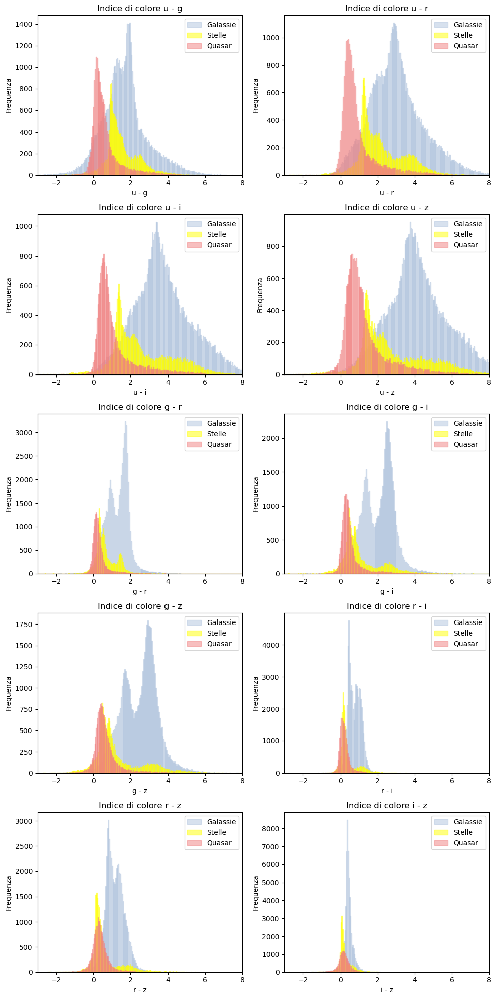

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import itertools

# Leggi il DataFrame rielaborato
input_file = 'dataset_rielaborato_filtrato.csv'
data = pd.read_csv(input_file)

# Filtra i dati per le tre classi: Galassie, Stelle e Quasar
galaxy_data = data[data['label_GALAXY'] == True].copy()
star_data = data[data['label_STAR'] == True].copy()
qso_data = data[data['label_QSO'] == True].copy()

# Definisci i filtri disponibili
filters = ['u', 'g', 'r', 'i', 'z']

# Crea tutte le combinazioni di coppie di filtri
filter_combinations = list(itertools.combinations(filters, 2))

# Dimensioni del layout della griglia per i grafici (2 righe x 5 colonne)
plt.figure(figsize=(10, 20))

# Definisci i colori per le diverse classi
colors = {'Galassie': 'lightsteelblue', 'Stelle': 'yellow', 'Quasar': 'lightcoral'}

# Ciclo su tutte le combinazioni di coppie di filtri
for idx, (filter1, filter2) in enumerate(filter_combinations, 1):
    # Calcola l'indice di colore per la coppia di filtri (filter1 - filter2) per ciascuna classe
    galaxy_data[f'{filter1}_minus_{filter2}'] = galaxy_data[filter1] - galaxy_data[filter2]
    star_data[f'{filter1}_minus_{filter2}'] = star_data[filter1] - star_data[filter2]
    qso_data[f'{filter1}_minus_{filter2}'] = qso_data[filter1] - qso_data[filter2]
    
    # Crea un subplot per ciascun istogramma
    plt.subplot(5, 2, idx)
    
    # Disegna gli istogrammi sovrapposti per le tre classi
    plt.hist(galaxy_data[f'{filter1}_minus_{filter2}'], bins=500, color=colors['Galassie'], alpha=0.5, label='Galassie', edgecolor=colors['Galassie'])
    plt.hist(star_data[f'{filter1}_minus_{filter2}'], bins=500, color=colors['Stelle'], alpha=0.5, label='Stelle', edgecolor=colors['Stelle'])
    plt.hist(qso_data[f'{filter1}_minus_{filter2}'], bins=500, color=colors['Quasar'], alpha=0.5, label='Quasar', edgecolor=colors['Quasar'])
    
    # Imposta il titolo e le etichette
    plt.title(f'Indice di colore {filter1} - {filter2}', fontsize=12)
    plt.xlabel(f'{filter1} - {filter2}', fontsize=10)
    plt.ylabel('Frequenza', fontsize=10)
    plt.xlim(-3, 8)     #normale
    #plt.xlim(-5, 10)   #largo
    #plt.xlim(-3, 5)   #zoom
    #plt.xlim(-1, 3)   #zoomzoom
    
    # Aggiungi la legenda
    plt.legend()

# Layout ordinato
plt.tight_layout()
# Salvo l'immagine
plt.savefig('./Immagini/2.6_Indici di colore.png')
plt.show()